<a href="https://colab.research.google.com/github/aki-1222/94tmnist/blob/main/GAN_94tmnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
### -*-coding:utf-8-*-
from __future__ import print_function, division

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam

import matplotlib.pyplot as plt
import tensorflow as tf
import sys

import numpy as np

import os

In [ ]:
import pickle

np.set_printoptions(threshold=1000)
#pickleを用いてファイルを開く。
with open('/content/drive/MyDrive/TMNIST_94/94tmnist.binaryfile', 'rb') as inp:
  _digits = pickle.load(inp)

In [ ]:
#保存先
foldername="94_tmnist_gan_pictures3"

# 保存するフォルダの作成
file = os.path.exists("/content/drive/MyDrive/"+foldername)
print(file)
 
if file == False:
    os.mkdir("/content/drive/MyDrive/"+foldername)

checkpoint_foldername="checkpoint_94_12"
checkpoint_foldername="/content/drive/MyDrive/"+checkpoint_foldername
file=os.path.exists(checkpoint_foldername)
if file==False:
    os.mkdir(checkpoint_foldername)

False


In [ ]:
# datasize for mnist image set
self.img_rows = 28
self.img_cols = 28
        \self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        
        self.z_dim = 100

        optimizer = Adam(0.0002, 0.5)

        
        # discriminator modelu
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', 
            optimizer=optimizer,
            metrics=['accuracy'])

        # Generator model
        self.generator = self.build_generator()

        
        # we don't need to compile generator because generator learns with descriminatorgenerator as 'combined'
        #self.generator.compile(loss='binary_crossentropy', optimizer=optimizer)
        
        # we can define combined model by two ways (results are same)
        # please see https://qiita.com/triwave33/items/1890ccc71fab6cbca87e
        # sorry in Japanese
        self.combined = self.build_combined1()
        #self.combined = self.build_combined2()
        self.combined.compile(loss='binary_crossentropy', 
                                    optimizer=optimizer)
        
        generator_optimizer=Adam(0.0002, 0.5)
        discriminator_optimizer=Adam(0.0002, 0.5)
        checkpoint_dir = checkpoint_foldername+'/training_checkpoints'
        checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
        checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=self.build_generator(),
                                 discriminator=self.build_discriminator()
                                 )
        ckpt_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)
        if ckpt_manager.latest_checkpoint:
            checkpoint.restore(ckpt_manager.latest_checkpoint)
            print ('Latest checkpoint restored!!')

IndentationError: ignored

In [ ]:
class GAN():
    def __init__(self):
        # datasize for mnist image set
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        
        self.z_dim = 100

        optimizer = Adam(0.0002, 0.5)

        
        # discriminator modelu
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', 
            optimizer=optimizer,
            metrics=['accuracy'])

        # Generator model
        self.generator = self.build_generator()

        
        # we don't need to compile generator because generator learns with descriminatorgenerator as 'combined'
        #self.generator.compile(loss='binary_crossentropy', optimizer=optimizer)
        
        # we can define combined model by two ways (results are same)
        # please see https://qiita.com/triwave33/items/1890ccc71fab6cbca87e
        # sorry in Japanese
        self.combined = self.build_combined1()
        #self.combined = self.build_combined2()
        self.combined.compile(loss='binary_crossentropy', 
                                    optimizer=optimizer)
        
        global checkpoint,checkpoint_dir,checkpoint_prefix
        generator_optimizer=Adam(0.0002, 0.5)
        discriminator_optimizer=Adam(0.0002, 0.5)
        checkpoint_dir = checkpoint_foldername+'/training_checkpoints'
        checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
        checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=self.build_generator(),
                                 discriminator=self.build_discriminator()
                                 )
        checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
        ckpt_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)
        if ckpt_manager.latest_checkpoint:
            checkpoint.restore(ckpt_manager.latest_checkpoint)
            print ('Latest checkpoint restored!!')
        

    def build_generator(self):

        noise_shape = (self.z_dim,)
        model = Sequential()

        model.add(Dense(256, input_shape=noise_shape))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        return model

    def build_discriminator(self):

        img_shape = (self.img_rows, self.img_cols, self.channels)
        
        model = Sequential()

        model.add(Flatten(input_shape=img_shape))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        return model
    
    def build_combined1(self):
        self.discriminator.trainable = False
        model = Sequential([self.generator, self.discriminator])
        return model

    def build_combined2(self):
        z = Input(shape=(self.z_dim,))
        img = self.generator(z)
        self.discriminator.trainable = False
        valid = self.discriminator(img)
        model = Model(z, valid)
        model.summary()
        return model



    def train(self, epochs, batch_size=128, save_interval=500,optimizer = Adam(0.0002, 0.5)):
        checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

        X_train=_digits

        # normalize
        X_train = (X_train.astype(np.float32) - 127.5) / 127.5
      
        half_batch = int(batch_size / 2)

        num_batches = int(X_train.shape[0] / (half_batch*5))
        print('Number of batches:', num_batches)

        
      
        for epoch in range(epochs):

            for iteration in range(num_batches):

                # ---------------------
                #  Discriminator learning
                # ---------------------

                # pickup images (half-batch size) from generator 
                noise = np.random.normal(0, 1, (half_batch, self.z_dim))
                gen_imgs = self.generator.predict(noise)


                # pickup images (half-batch size) from dataset
                idx = np.random.randint(0, X_train.shape[0], half_batch)
                imgs = X_train[idx]

                # learn discriminator
                # learning discriminator with real-data and fake-data seperately
                d_loss_real = self.discriminator.train_on_batch(imgs, np.ones((half_batch, 1)))
                d_loss_fake = self.discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)))
                # average each loss
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)


                # ---------------------
                #  Generator learning
                # ---------------------

                noise = np.random.normal(0, 1, (batch_size, self.z_dim))

                # make label (gen data: 1) 
                valid_y = np.array([1] * batch_size)

                # Train the generator
                g_loss = self.combined.train_on_batch(noise, valid_y)

                # progress
                print ("epoch:%d, iter:%d,  [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, iteration, d_loss[0], 100*d_loss[1], g_loss))

                # save images 
            if epoch % save_interval == 0:
                self.save_imgs(epoch)
                checkpoint.save(file_prefix = checkpoint_prefix)

    def save_imgs(self, epoch):
        # row,col
        r, c = 3, 3

        noise = np.random.normal(0, 1, (r * c, self.z_dim))
        gen_imgs = self.generator.predict(noise)

        # rescale [-1, 1] to [0, 1]
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        plt.show()

        if os.path.exists('/content/drive/MyDrive/'+foldername+'/tmnist_digits_%d.png'%epoch):
            fig.savefig('/content/drive/MyDrive/'+foldername+'/tmnist_digits_%d_2.png'%epoch)
        else:
            fig.savefig("/content/drive/MyDrive/"+foldername+"/"+"tmnist_digits_%d.png" % epoch)
        plt.close()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 512)               401920    
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 533,505
Trainable params: 533,505
Non-trai

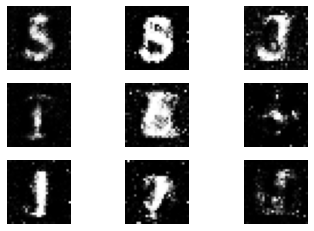

epoch:1, iter:0,  [D loss: 0.566629, acc.: 71.88%] [G loss: 0.913974]
epoch:1, iter:1,  [D loss: 0.664168, acc.: 68.75%] [G loss: 0.940060]
epoch:1, iter:2,  [D loss: 0.585911, acc.: 71.88%] [G loss: 1.003841]
epoch:1, iter:3,  [D loss: 0.586606, acc.: 71.88%] [G loss: 0.996377]
epoch:1, iter:4,  [D loss: 0.612598, acc.: 65.62%] [G loss: 1.012074]
epoch:1, iter:5,  [D loss: 0.719568, acc.: 53.12%] [G loss: 1.025581]
epoch:1, iter:6,  [D loss: 0.559204, acc.: 71.88%] [G loss: 0.939351]
epoch:1, iter:7,  [D loss: 0.575072, acc.: 75.00%] [G loss: 0.948538]
epoch:1, iter:8,  [D loss: 0.676835, acc.: 68.75%] [G loss: 0.887768]
epoch:1, iter:9,  [D loss: 0.669976, acc.: 50.00%] [G loss: 0.934247]
epoch:1, iter:10,  [D loss: 0.528056, acc.: 75.00%] [G loss: 0.959758]
epoch:1, iter:11,  [D loss: 0.564284, acc.: 71.88%] [G loss: 0.989883]
epoch:1, iter:12,  [D loss: 0.663190, acc.: 59.38%] [G loss: 0.904487]
epoch:1, iter:13,  [D loss: 0.507159, acc.: 78.12%] [G loss: 0.986114]
epoch:1, iter:14

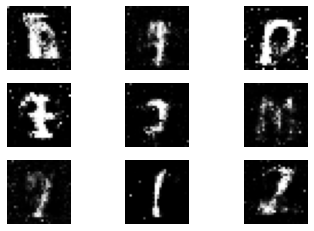

epoch:2, iter:0,  [D loss: 0.587498, acc.: 62.50%] [G loss: 1.001364]
epoch:2, iter:1,  [D loss: 0.715709, acc.: 43.75%] [G loss: 0.912590]
epoch:2, iter:2,  [D loss: 0.676402, acc.: 46.88%] [G loss: 1.013103]
epoch:2, iter:3,  [D loss: 0.657266, acc.: 53.12%] [G loss: 0.990869]
epoch:2, iter:4,  [D loss: 0.602952, acc.: 62.50%] [G loss: 0.948159]
epoch:2, iter:5,  [D loss: 0.596935, acc.: 68.75%] [G loss: 0.976539]
epoch:2, iter:6,  [D loss: 0.572213, acc.: 71.88%] [G loss: 1.099682]
epoch:2, iter:7,  [D loss: 0.662666, acc.: 65.62%] [G loss: 0.977013]
epoch:2, iter:8,  [D loss: 0.673862, acc.: 62.50%] [G loss: 0.994564]
epoch:2, iter:9,  [D loss: 0.624894, acc.: 59.38%] [G loss: 1.002203]
epoch:2, iter:10,  [D loss: 0.644979, acc.: 65.62%] [G loss: 0.997626]
epoch:2, iter:11,  [D loss: 0.662721, acc.: 65.62%] [G loss: 1.027479]
epoch:2, iter:12,  [D loss: 0.635766, acc.: 68.75%] [G loss: 0.984776]
epoch:2, iter:13,  [D loss: 0.603844, acc.: 59.38%] [G loss: 1.045779]
epoch:2, iter:14

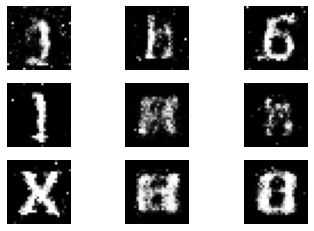

epoch:3, iter:0,  [D loss: 0.634693, acc.: 56.25%] [G loss: 1.069560]
epoch:3, iter:1,  [D loss: 0.571735, acc.: 78.12%] [G loss: 1.004157]
epoch:3, iter:2,  [D loss: 0.533553, acc.: 75.00%] [G loss: 0.985487]
epoch:3, iter:3,  [D loss: 0.568435, acc.: 68.75%] [G loss: 1.047049]
epoch:3, iter:4,  [D loss: 0.682089, acc.: 46.88%] [G loss: 1.036510]
epoch:3, iter:5,  [D loss: 0.598930, acc.: 59.38%] [G loss: 1.044973]
epoch:3, iter:6,  [D loss: 0.633407, acc.: 65.62%] [G loss: 0.986329]
epoch:3, iter:7,  [D loss: 0.499844, acc.: 78.12%] [G loss: 1.073214]
epoch:3, iter:8,  [D loss: 0.588767, acc.: 68.75%] [G loss: 1.069438]
epoch:3, iter:9,  [D loss: 0.618868, acc.: 65.62%] [G loss: 0.992381]
epoch:3, iter:10,  [D loss: 0.570815, acc.: 78.12%] [G loss: 0.966464]
epoch:3, iter:11,  [D loss: 0.547354, acc.: 75.00%] [G loss: 1.040210]
epoch:3, iter:12,  [D loss: 0.467110, acc.: 84.38%] [G loss: 1.023624]
epoch:3, iter:13,  [D loss: 0.594249, acc.: 68.75%] [G loss: 0.955935]
epoch:3, iter:14

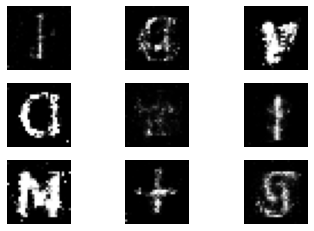

epoch:4, iter:0,  [D loss: 0.577064, acc.: 75.00%] [G loss: 1.069833]
epoch:4, iter:1,  [D loss: 0.639357, acc.: 65.62%] [G loss: 0.975046]
epoch:4, iter:2,  [D loss: 0.512726, acc.: 75.00%] [G loss: 1.018330]
epoch:4, iter:3,  [D loss: 0.630194, acc.: 62.50%] [G loss: 1.104393]
epoch:4, iter:4,  [D loss: 0.507099, acc.: 78.12%] [G loss: 1.106151]
epoch:4, iter:5,  [D loss: 0.640247, acc.: 65.62%] [G loss: 1.108504]
epoch:4, iter:6,  [D loss: 0.531125, acc.: 71.88%] [G loss: 1.000556]
epoch:4, iter:7,  [D loss: 0.557508, acc.: 68.75%] [G loss: 1.048568]
epoch:4, iter:8,  [D loss: 0.597055, acc.: 65.62%] [G loss: 1.048615]
epoch:4, iter:9,  [D loss: 0.615628, acc.: 65.62%] [G loss: 1.067446]
epoch:4, iter:10,  [D loss: 0.589599, acc.: 65.62%] [G loss: 1.042616]
epoch:4, iter:11,  [D loss: 0.556375, acc.: 68.75%] [G loss: 1.143667]
epoch:4, iter:12,  [D loss: 0.627268, acc.: 71.88%] [G loss: 1.023877]
epoch:4, iter:13,  [D loss: 0.532795, acc.: 75.00%] [G loss: 1.155851]
epoch:4, iter:14

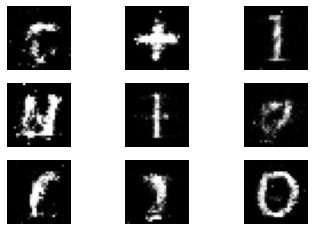

epoch:5, iter:0,  [D loss: 0.502371, acc.: 75.00%] [G loss: 1.174830]
epoch:5, iter:1,  [D loss: 0.535092, acc.: 81.25%] [G loss: 1.145433]
epoch:5, iter:2,  [D loss: 0.662981, acc.: 65.62%] [G loss: 1.131877]
epoch:5, iter:3,  [D loss: 0.604513, acc.: 65.62%] [G loss: 0.985080]
epoch:5, iter:4,  [D loss: 0.564164, acc.: 62.50%] [G loss: 1.125292]
epoch:5, iter:5,  [D loss: 0.540348, acc.: 71.88%] [G loss: 1.064889]
epoch:5, iter:6,  [D loss: 0.594329, acc.: 68.75%] [G loss: 1.057120]
epoch:5, iter:7,  [D loss: 0.579903, acc.: 71.88%] [G loss: 1.119315]
epoch:5, iter:8,  [D loss: 0.594175, acc.: 68.75%] [G loss: 1.196559]
epoch:5, iter:9,  [D loss: 0.572054, acc.: 68.75%] [G loss: 1.264023]
epoch:5, iter:10,  [D loss: 0.456116, acc.: 81.25%] [G loss: 1.265180]
epoch:5, iter:11,  [D loss: 0.537346, acc.: 75.00%] [G loss: 1.064089]
epoch:5, iter:12,  [D loss: 0.488334, acc.: 81.25%] [G loss: 1.171312]
epoch:5, iter:13,  [D loss: 0.565089, acc.: 62.50%] [G loss: 1.096251]
epoch:5, iter:14

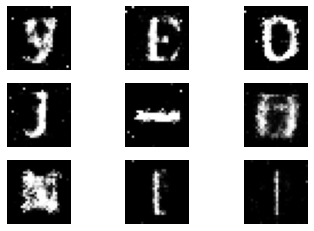

epoch:6, iter:0,  [D loss: 0.686026, acc.: 71.88%] [G loss: 0.987277]
epoch:6, iter:1,  [D loss: 0.676813, acc.: 59.38%] [G loss: 1.064327]
epoch:6, iter:2,  [D loss: 0.615797, acc.: 59.38%] [G loss: 1.043184]
epoch:6, iter:3,  [D loss: 0.616535, acc.: 59.38%] [G loss: 0.962520]
epoch:6, iter:4,  [D loss: 0.496669, acc.: 75.00%] [G loss: 1.150515]
epoch:6, iter:5,  [D loss: 0.666295, acc.: 53.12%] [G loss: 1.013930]
epoch:6, iter:6,  [D loss: 0.607783, acc.: 62.50%] [G loss: 1.116350]
epoch:6, iter:7,  [D loss: 0.562510, acc.: 71.88%] [G loss: 0.940498]
epoch:6, iter:8,  [D loss: 0.553789, acc.: 65.62%] [G loss: 1.246800]
epoch:6, iter:9,  [D loss: 0.519604, acc.: 75.00%] [G loss: 1.206635]
epoch:6, iter:10,  [D loss: 0.645124, acc.: 53.12%] [G loss: 1.171148]
epoch:6, iter:11,  [D loss: 0.627662, acc.: 62.50%] [G loss: 1.324748]
epoch:6, iter:12,  [D loss: 0.527291, acc.: 71.88%] [G loss: 1.405982]
epoch:6, iter:13,  [D loss: 0.605058, acc.: 68.75%] [G loss: 1.338775]
epoch:6, iter:14

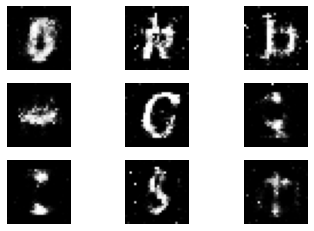

epoch:7, iter:0,  [D loss: 0.534809, acc.: 71.88%] [G loss: 1.352147]
epoch:7, iter:1,  [D loss: 0.397707, acc.: 81.25%] [G loss: 1.264191]
epoch:7, iter:2,  [D loss: 0.460859, acc.: 75.00%] [G loss: 1.197322]
epoch:7, iter:3,  [D loss: 0.607439, acc.: 68.75%] [G loss: 1.189508]
epoch:7, iter:4,  [D loss: 0.447432, acc.: 78.12%] [G loss: 1.094372]
epoch:7, iter:5,  [D loss: 0.506323, acc.: 75.00%] [G loss: 1.182203]
epoch:7, iter:6,  [D loss: 0.546471, acc.: 75.00%] [G loss: 1.185003]
epoch:7, iter:7,  [D loss: 0.654183, acc.: 62.50%] [G loss: 1.232386]
epoch:7, iter:8,  [D loss: 0.635011, acc.: 59.38%] [G loss: 1.189349]
epoch:7, iter:9,  [D loss: 0.698183, acc.: 62.50%] [G loss: 1.137966]
epoch:7, iter:10,  [D loss: 0.579767, acc.: 62.50%] [G loss: 1.015338]
epoch:7, iter:11,  [D loss: 0.567940, acc.: 65.62%] [G loss: 1.022856]
epoch:7, iter:12,  [D loss: 0.510450, acc.: 68.75%] [G loss: 1.221199]
epoch:7, iter:13,  [D loss: 0.576514, acc.: 68.75%] [G loss: 1.143913]
epoch:7, iter:14

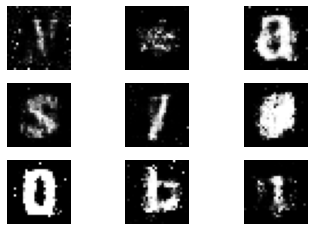

epoch:8, iter:0,  [D loss: 0.515398, acc.: 75.00%] [G loss: 1.194663]
epoch:8, iter:1,  [D loss: 0.568685, acc.: 75.00%] [G loss: 1.172070]
epoch:8, iter:2,  [D loss: 0.477692, acc.: 81.25%] [G loss: 1.327211]
epoch:8, iter:3,  [D loss: 0.405045, acc.: 81.25%] [G loss: 1.261175]
epoch:8, iter:4,  [D loss: 0.403388, acc.: 78.12%] [G loss: 1.378159]
epoch:8, iter:5,  [D loss: 0.887130, acc.: 46.88%] [G loss: 1.174472]
epoch:8, iter:6,  [D loss: 0.534463, acc.: 65.62%] [G loss: 1.279231]
epoch:8, iter:7,  [D loss: 0.545999, acc.: 68.75%] [G loss: 1.138304]
epoch:8, iter:8,  [D loss: 0.594919, acc.: 65.62%] [G loss: 1.146797]
epoch:8, iter:9,  [D loss: 0.604528, acc.: 65.62%] [G loss: 1.044122]
epoch:8, iter:10,  [D loss: 0.493904, acc.: 78.12%] [G loss: 1.121575]
epoch:8, iter:11,  [D loss: 0.579228, acc.: 62.50%] [G loss: 1.107217]
epoch:8, iter:12,  [D loss: 0.581425, acc.: 68.75%] [G loss: 1.185341]
epoch:8, iter:13,  [D loss: 0.423640, acc.: 84.38%] [G loss: 1.266564]
epoch:8, iter:14

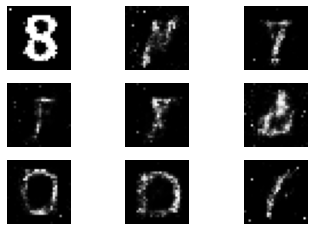

epoch:9, iter:0,  [D loss: 0.523767, acc.: 81.25%] [G loss: 1.161399]
epoch:9, iter:1,  [D loss: 0.614095, acc.: 75.00%] [G loss: 1.167856]
epoch:9, iter:2,  [D loss: 0.509549, acc.: 75.00%] [G loss: 1.223158]
epoch:9, iter:3,  [D loss: 0.574229, acc.: 65.62%] [G loss: 1.074141]
epoch:9, iter:4,  [D loss: 0.604285, acc.: 68.75%] [G loss: 1.191860]
epoch:9, iter:5,  [D loss: 0.575497, acc.: 62.50%] [G loss: 1.316771]
epoch:9, iter:6,  [D loss: 0.529216, acc.: 68.75%] [G loss: 1.279296]
epoch:9, iter:7,  [D loss: 0.641628, acc.: 62.50%] [G loss: 1.346108]
epoch:9, iter:8,  [D loss: 0.623996, acc.: 71.88%] [G loss: 1.258566]
epoch:9, iter:9,  [D loss: 0.440357, acc.: 81.25%] [G loss: 1.343450]
epoch:9, iter:10,  [D loss: 0.678594, acc.: 59.38%] [G loss: 1.310519]
epoch:9, iter:11,  [D loss: 0.504035, acc.: 65.62%] [G loss: 1.285504]
epoch:9, iter:12,  [D loss: 0.676398, acc.: 56.25%] [G loss: 1.177318]
epoch:9, iter:13,  [D loss: 0.577870, acc.: 81.25%] [G loss: 1.309785]
epoch:9, iter:14

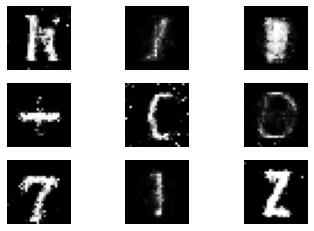

epoch:10, iter:0,  [D loss: 0.464790, acc.: 81.25%] [G loss: 1.325440]
epoch:10, iter:1,  [D loss: 0.666031, acc.: 56.25%] [G loss: 1.365035]
epoch:10, iter:2,  [D loss: 0.672583, acc.: 53.12%] [G loss: 1.197876]
epoch:10, iter:3,  [D loss: 0.386011, acc.: 84.38%] [G loss: 1.255553]
epoch:10, iter:4,  [D loss: 0.543935, acc.: 68.75%] [G loss: 1.235355]
epoch:10, iter:5,  [D loss: 0.545271, acc.: 68.75%] [G loss: 1.252074]
epoch:10, iter:6,  [D loss: 0.753225, acc.: 46.88%] [G loss: 1.092894]
epoch:10, iter:7,  [D loss: 0.521694, acc.: 75.00%] [G loss: 1.331621]
epoch:10, iter:8,  [D loss: 0.756718, acc.: 46.88%] [G loss: 1.138387]
epoch:10, iter:9,  [D loss: 0.453487, acc.: 87.50%] [G loss: 1.258088]
epoch:10, iter:10,  [D loss: 0.623131, acc.: 62.50%] [G loss: 1.170323]
epoch:10, iter:11,  [D loss: 0.475024, acc.: 81.25%] [G loss: 1.280771]
epoch:10, iter:12,  [D loss: 0.516482, acc.: 75.00%] [G loss: 1.271511]
epoch:10, iter:13,  [D loss: 0.614034, acc.: 65.62%] [G loss: 1.255345]
ep

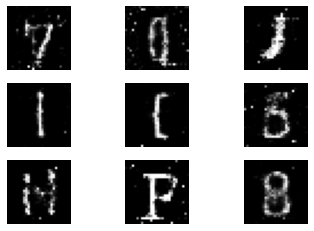

epoch:11, iter:0,  [D loss: 0.648084, acc.: 62.50%] [G loss: 1.342809]
epoch:11, iter:1,  [D loss: 0.553341, acc.: 71.88%] [G loss: 1.313117]
epoch:11, iter:2,  [D loss: 0.583717, acc.: 75.00%] [G loss: 1.246537]
epoch:11, iter:3,  [D loss: 0.602489, acc.: 71.88%] [G loss: 1.182422]
epoch:11, iter:4,  [D loss: 0.482729, acc.: 68.75%] [G loss: 1.193421]
epoch:11, iter:5,  [D loss: 0.484338, acc.: 81.25%] [G loss: 1.197962]
epoch:11, iter:6,  [D loss: 0.555871, acc.: 68.75%] [G loss: 1.281662]
epoch:11, iter:7,  [D loss: 0.542357, acc.: 78.12%] [G loss: 1.273453]
epoch:11, iter:8,  [D loss: 0.526900, acc.: 71.88%] [G loss: 1.319372]
epoch:11, iter:9,  [D loss: 0.508092, acc.: 71.88%] [G loss: 1.328381]
epoch:11, iter:10,  [D loss: 0.564021, acc.: 65.62%] [G loss: 1.273402]
epoch:11, iter:11,  [D loss: 0.540326, acc.: 81.25%] [G loss: 1.179922]
epoch:11, iter:12,  [D loss: 0.755574, acc.: 62.50%] [G loss: 1.320191]
epoch:11, iter:13,  [D loss: 0.478781, acc.: 71.88%] [G loss: 1.195868]
ep

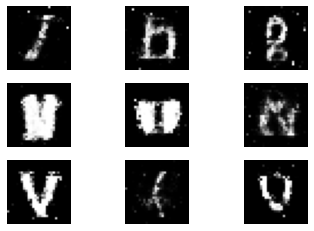

epoch:12, iter:0,  [D loss: 0.502197, acc.: 78.12%] [G loss: 1.288101]
epoch:12, iter:1,  [D loss: 0.676372, acc.: 65.62%] [G loss: 1.257367]
epoch:12, iter:2,  [D loss: 0.552066, acc.: 68.75%] [G loss: 1.249133]
epoch:12, iter:3,  [D loss: 0.532504, acc.: 68.75%] [G loss: 1.323302]
epoch:12, iter:4,  [D loss: 0.516515, acc.: 75.00%] [G loss: 1.309627]
epoch:12, iter:5,  [D loss: 0.344347, acc.: 87.50%] [G loss: 1.402209]
epoch:12, iter:6,  [D loss: 0.449142, acc.: 84.38%] [G loss: 1.356134]
epoch:12, iter:7,  [D loss: 0.536667, acc.: 65.62%] [G loss: 1.332970]
epoch:12, iter:8,  [D loss: 0.437638, acc.: 81.25%] [G loss: 1.236299]
epoch:12, iter:9,  [D loss: 0.572230, acc.: 71.88%] [G loss: 1.253812]
epoch:12, iter:10,  [D loss: 0.415080, acc.: 84.38%] [G loss: 1.314347]
epoch:12, iter:11,  [D loss: 0.503119, acc.: 68.75%] [G loss: 1.199384]
epoch:12, iter:12,  [D loss: 0.557566, acc.: 68.75%] [G loss: 1.232404]
epoch:12, iter:13,  [D loss: 0.458822, acc.: 81.25%] [G loss: 1.322862]
ep

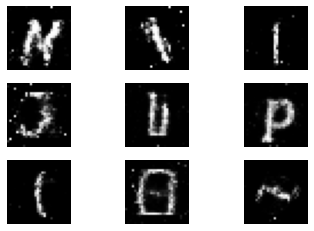

epoch:13, iter:0,  [D loss: 0.528458, acc.: 81.25%] [G loss: 1.499675]
epoch:13, iter:1,  [D loss: 0.701379, acc.: 62.50%] [G loss: 1.413271]
epoch:13, iter:2,  [D loss: 0.379748, acc.: 81.25%] [G loss: 1.268376]
epoch:13, iter:3,  [D loss: 0.553431, acc.: 68.75%] [G loss: 1.364868]
epoch:13, iter:4,  [D loss: 0.434406, acc.: 81.25%] [G loss: 1.348676]
epoch:13, iter:5,  [D loss: 0.549579, acc.: 75.00%] [G loss: 1.273650]
epoch:13, iter:6,  [D loss: 0.649637, acc.: 53.12%] [G loss: 1.198051]
epoch:13, iter:7,  [D loss: 0.528057, acc.: 84.38%] [G loss: 1.361327]
epoch:13, iter:8,  [D loss: 0.426636, acc.: 75.00%] [G loss: 1.389590]
epoch:13, iter:9,  [D loss: 0.602737, acc.: 68.75%] [G loss: 1.273494]
epoch:13, iter:10,  [D loss: 0.520983, acc.: 71.88%] [G loss: 1.338163]
epoch:13, iter:11,  [D loss: 0.546653, acc.: 68.75%] [G loss: 1.326974]
epoch:13, iter:12,  [D loss: 0.468237, acc.: 75.00%] [G loss: 1.332294]
epoch:13, iter:13,  [D loss: 0.539203, acc.: 75.00%] [G loss: 1.341017]
ep

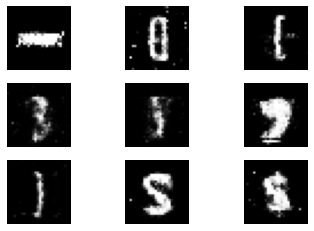

epoch:14, iter:0,  [D loss: 0.485882, acc.: 71.88%] [G loss: 1.300276]
epoch:14, iter:1,  [D loss: 0.409943, acc.: 87.50%] [G loss: 1.304914]
epoch:14, iter:2,  [D loss: 0.526473, acc.: 75.00%] [G loss: 1.300470]
epoch:14, iter:3,  [D loss: 0.466913, acc.: 68.75%] [G loss: 1.668127]
epoch:14, iter:4,  [D loss: 0.496150, acc.: 78.12%] [G loss: 1.591347]
epoch:14, iter:5,  [D loss: 0.528055, acc.: 75.00%] [G loss: 1.277327]
epoch:14, iter:6,  [D loss: 0.463832, acc.: 71.88%] [G loss: 1.416011]
epoch:14, iter:7,  [D loss: 0.524836, acc.: 71.88%] [G loss: 1.152446]
epoch:14, iter:8,  [D loss: 0.499842, acc.: 75.00%] [G loss: 1.635496]
epoch:14, iter:9,  [D loss: 0.455667, acc.: 84.38%] [G loss: 1.342511]
epoch:14, iter:10,  [D loss: 0.515919, acc.: 78.12%] [G loss: 1.320923]
epoch:14, iter:11,  [D loss: 0.293743, acc.: 90.62%] [G loss: 1.474721]
epoch:14, iter:12,  [D loss: 0.307357, acc.: 90.62%] [G loss: 1.589615]
epoch:14, iter:13,  [D loss: 0.561360, acc.: 68.75%] [G loss: 1.520263]
ep

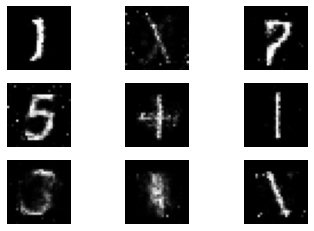

epoch:15, iter:0,  [D loss: 0.661877, acc.: 68.75%] [G loss: 1.286357]
epoch:15, iter:1,  [D loss: 0.465899, acc.: 71.88%] [G loss: 1.272805]
epoch:15, iter:2,  [D loss: 0.608018, acc.: 65.62%] [G loss: 1.130104]
epoch:15, iter:3,  [D loss: 0.492710, acc.: 75.00%] [G loss: 1.426327]
epoch:15, iter:4,  [D loss: 0.588442, acc.: 62.50%] [G loss: 1.492544]
epoch:15, iter:5,  [D loss: 0.553758, acc.: 75.00%] [G loss: 1.412465]
epoch:15, iter:6,  [D loss: 0.410676, acc.: 84.38%] [G loss: 1.551236]
epoch:15, iter:7,  [D loss: 0.601105, acc.: 71.88%] [G loss: 1.528798]
epoch:15, iter:8,  [D loss: 0.487808, acc.: 78.12%] [G loss: 1.407496]
epoch:15, iter:9,  [D loss: 0.404285, acc.: 87.50%] [G loss: 1.318756]
epoch:15, iter:10,  [D loss: 0.571673, acc.: 59.38%] [G loss: 1.502819]
epoch:15, iter:11,  [D loss: 0.470364, acc.: 75.00%] [G loss: 1.514345]
epoch:15, iter:12,  [D loss: 0.429622, acc.: 78.12%] [G loss: 1.429662]
epoch:15, iter:13,  [D loss: 0.450801, acc.: 78.12%] [G loss: 1.727651]
ep

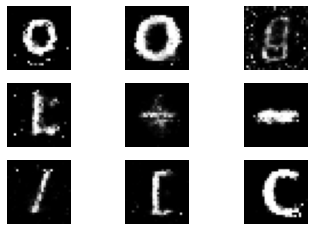

epoch:16, iter:0,  [D loss: 0.619099, acc.: 68.75%] [G loss: 1.647537]
epoch:16, iter:1,  [D loss: 0.495336, acc.: 78.12%] [G loss: 1.573627]
epoch:16, iter:2,  [D loss: 0.418190, acc.: 78.12%] [G loss: 1.473571]
epoch:16, iter:3,  [D loss: 0.540822, acc.: 65.62%] [G loss: 1.334670]
epoch:16, iter:4,  [D loss: 0.513759, acc.: 75.00%] [G loss: 1.421713]
epoch:16, iter:5,  [D loss: 0.316766, acc.: 87.50%] [G loss: 1.565321]
epoch:16, iter:6,  [D loss: 0.478522, acc.: 71.88%] [G loss: 1.586866]
epoch:16, iter:7,  [D loss: 0.606571, acc.: 71.88%] [G loss: 1.316292]
epoch:16, iter:8,  [D loss: 0.386200, acc.: 90.62%] [G loss: 1.408194]
epoch:16, iter:9,  [D loss: 0.501736, acc.: 75.00%] [G loss: 1.445740]
epoch:16, iter:10,  [D loss: 0.502200, acc.: 75.00%] [G loss: 1.298358]
epoch:16, iter:11,  [D loss: 0.455317, acc.: 81.25%] [G loss: 1.405927]
epoch:16, iter:12,  [D loss: 0.458141, acc.: 78.12%] [G loss: 1.392459]
epoch:16, iter:13,  [D loss: 0.455766, acc.: 81.25%] [G loss: 1.422004]
ep

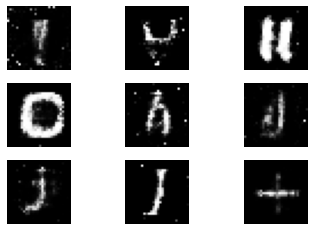

epoch:17, iter:0,  [D loss: 0.394841, acc.: 75.00%] [G loss: 1.845786]
epoch:17, iter:1,  [D loss: 0.618417, acc.: 68.75%] [G loss: 1.574359]
epoch:17, iter:2,  [D loss: 0.517198, acc.: 71.88%] [G loss: 1.398972]
epoch:17, iter:3,  [D loss: 0.549171, acc.: 71.88%] [G loss: 1.466563]
epoch:17, iter:4,  [D loss: 0.472978, acc.: 78.12%] [G loss: 1.227834]
epoch:17, iter:5,  [D loss: 0.483818, acc.: 84.38%] [G loss: 1.323002]
epoch:17, iter:6,  [D loss: 0.555509, acc.: 75.00%] [G loss: 1.281976]
epoch:17, iter:7,  [D loss: 0.477340, acc.: 78.12%] [G loss: 1.432750]
epoch:17, iter:8,  [D loss: 0.525295, acc.: 71.88%] [G loss: 1.397328]
epoch:17, iter:9,  [D loss: 0.356597, acc.: 84.38%] [G loss: 1.294053]
epoch:17, iter:10,  [D loss: 0.442659, acc.: 78.12%] [G loss: 1.487383]
epoch:17, iter:11,  [D loss: 0.473553, acc.: 81.25%] [G loss: 1.521591]
epoch:17, iter:12,  [D loss: 0.398959, acc.: 81.25%] [G loss: 1.647785]
epoch:17, iter:13,  [D loss: 0.568626, acc.: 78.12%] [G loss: 1.489216]
ep

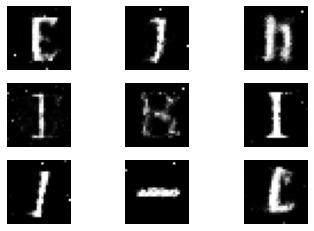

epoch:18, iter:0,  [D loss: 0.590265, acc.: 68.75%] [G loss: 1.469562]
epoch:18, iter:1,  [D loss: 0.519064, acc.: 68.75%] [G loss: 1.495834]
epoch:18, iter:2,  [D loss: 0.638167, acc.: 68.75%] [G loss: 1.455424]
epoch:18, iter:3,  [D loss: 0.603844, acc.: 65.62%] [G loss: 1.382416]
epoch:18, iter:4,  [D loss: 0.464288, acc.: 81.25%] [G loss: 1.265409]
epoch:18, iter:5,  [D loss: 0.438485, acc.: 84.38%] [G loss: 1.424179]
epoch:18, iter:6,  [D loss: 0.397920, acc.: 90.62%] [G loss: 1.671058]
epoch:18, iter:7,  [D loss: 0.356564, acc.: 90.62%] [G loss: 1.785687]
epoch:18, iter:8,  [D loss: 0.393983, acc.: 81.25%] [G loss: 1.666635]
epoch:18, iter:9,  [D loss: 0.647546, acc.: 62.50%] [G loss: 1.433706]
epoch:18, iter:10,  [D loss: 0.678108, acc.: 59.38%] [G loss: 1.251665]
epoch:18, iter:11,  [D loss: 0.529506, acc.: 75.00%] [G loss: 1.207178]
epoch:18, iter:12,  [D loss: 0.385527, acc.: 84.38%] [G loss: 1.321056]
epoch:18, iter:13,  [D loss: 0.465649, acc.: 81.25%] [G loss: 1.312767]
ep

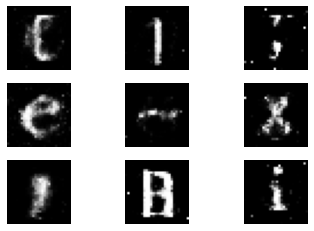

epoch:19, iter:0,  [D loss: 0.493556, acc.: 71.88%] [G loss: 1.304857]
epoch:19, iter:1,  [D loss: 0.411807, acc.: 78.12%] [G loss: 1.290280]
epoch:19, iter:2,  [D loss: 0.563837, acc.: 75.00%] [G loss: 1.524128]
epoch:19, iter:3,  [D loss: 0.438914, acc.: 84.38%] [G loss: 1.523129]
epoch:19, iter:4,  [D loss: 0.428496, acc.: 78.12%] [G loss: 1.536273]
epoch:19, iter:5,  [D loss: 0.477993, acc.: 75.00%] [G loss: 1.522523]
epoch:19, iter:6,  [D loss: 0.381719, acc.: 84.38%] [G loss: 1.880495]
epoch:19, iter:7,  [D loss: 0.329408, acc.: 87.50%] [G loss: 1.721853]
epoch:19, iter:8,  [D loss: 0.663064, acc.: 68.75%] [G loss: 1.349883]
epoch:19, iter:9,  [D loss: 0.674447, acc.: 65.62%] [G loss: 1.493403]
epoch:19, iter:10,  [D loss: 0.461188, acc.: 78.12%] [G loss: 1.394704]
epoch:19, iter:11,  [D loss: 0.398074, acc.: 87.50%] [G loss: 1.490151]
epoch:19, iter:12,  [D loss: 0.386886, acc.: 84.38%] [G loss: 1.451049]
epoch:19, iter:13,  [D loss: 0.661513, acc.: 62.50%] [G loss: 1.603246]
ep

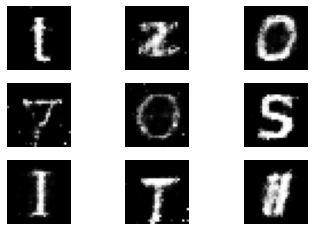

epoch:20, iter:0,  [D loss: 0.482251, acc.: 75.00%] [G loss: 1.754808]
epoch:20, iter:1,  [D loss: 0.393451, acc.: 81.25%] [G loss: 1.674434]
epoch:20, iter:2,  [D loss: 0.577058, acc.: 75.00%] [G loss: 1.554467]
epoch:20, iter:3,  [D loss: 0.556776, acc.: 71.88%] [G loss: 1.580394]
epoch:20, iter:4,  [D loss: 0.353647, acc.: 90.62%] [G loss: 1.538760]
epoch:20, iter:5,  [D loss: 0.444048, acc.: 78.12%] [G loss: 1.541683]
epoch:20, iter:6,  [D loss: 0.481889, acc.: 78.12%] [G loss: 1.689849]
epoch:20, iter:7,  [D loss: 0.559089, acc.: 81.25%] [G loss: 1.453740]
epoch:20, iter:8,  [D loss: 0.341923, acc.: 87.50%] [G loss: 1.459470]
epoch:20, iter:9,  [D loss: 0.554582, acc.: 75.00%] [G loss: 1.531303]
epoch:20, iter:10,  [D loss: 0.451776, acc.: 81.25%] [G loss: 1.620057]
epoch:20, iter:11,  [D loss: 0.300678, acc.: 90.62%] [G loss: 1.747971]
epoch:20, iter:12,  [D loss: 0.570142, acc.: 71.88%] [G loss: 1.573169]
epoch:20, iter:13,  [D loss: 0.498155, acc.: 81.25%] [G loss: 1.546511]
ep

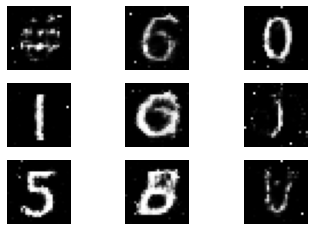

epoch:21, iter:0,  [D loss: 0.462142, acc.: 75.00%] [G loss: 1.553274]
epoch:21, iter:1,  [D loss: 0.405012, acc.: 87.50%] [G loss: 1.508055]
epoch:21, iter:2,  [D loss: 0.594581, acc.: 71.88%] [G loss: 1.943549]
epoch:21, iter:3,  [D loss: 0.429495, acc.: 87.50%] [G loss: 1.801094]
epoch:21, iter:4,  [D loss: 0.700877, acc.: 65.62%] [G loss: 1.565931]
epoch:21, iter:5,  [D loss: 0.482741, acc.: 78.12%] [G loss: 1.351079]
epoch:21, iter:6,  [D loss: 0.408328, acc.: 84.38%] [G loss: 1.580333]
epoch:21, iter:7,  [D loss: 0.550051, acc.: 71.88%] [G loss: 1.544959]
epoch:21, iter:8,  [D loss: 0.696894, acc.: 71.88%] [G loss: 1.523046]
epoch:21, iter:9,  [D loss: 0.648359, acc.: 62.50%] [G loss: 1.535847]
epoch:21, iter:10,  [D loss: 0.501035, acc.: 71.88%] [G loss: 1.548886]
epoch:21, iter:11,  [D loss: 0.444994, acc.: 81.25%] [G loss: 1.350264]
epoch:21, iter:12,  [D loss: 0.406842, acc.: 81.25%] [G loss: 1.358545]
epoch:21, iter:13,  [D loss: 0.526715, acc.: 78.12%] [G loss: 1.420061]
ep

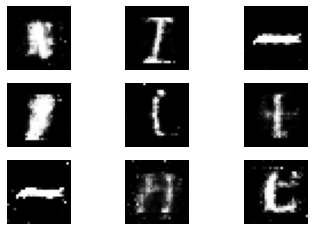

epoch:22, iter:0,  [D loss: 0.540502, acc.: 68.75%] [G loss: 1.420997]
epoch:22, iter:1,  [D loss: 0.516049, acc.: 75.00%] [G loss: 1.175182]
epoch:22, iter:2,  [D loss: 0.500255, acc.: 81.25%] [G loss: 1.495503]
epoch:22, iter:3,  [D loss: 0.403520, acc.: 81.25%] [G loss: 1.425402]
epoch:22, iter:4,  [D loss: 0.446680, acc.: 75.00%] [G loss: 1.320894]
epoch:22, iter:5,  [D loss: 0.428986, acc.: 78.12%] [G loss: 1.145247]
epoch:22, iter:6,  [D loss: 0.434449, acc.: 81.25%] [G loss: 1.129546]
epoch:22, iter:7,  [D loss: 0.508007, acc.: 68.75%] [G loss: 1.326540]
epoch:22, iter:8,  [D loss: 0.496926, acc.: 65.62%] [G loss: 1.339031]
epoch:22, iter:9,  [D loss: 0.377589, acc.: 87.50%] [G loss: 1.349720]
epoch:22, iter:10,  [D loss: 0.661319, acc.: 71.88%] [G loss: 1.234736]
epoch:22, iter:11,  [D loss: 0.423121, acc.: 84.38%] [G loss: 1.388082]
epoch:22, iter:12,  [D loss: 0.441626, acc.: 78.12%] [G loss: 1.679832]
epoch:22, iter:13,  [D loss: 0.526596, acc.: 75.00%] [G loss: 1.718904]
ep

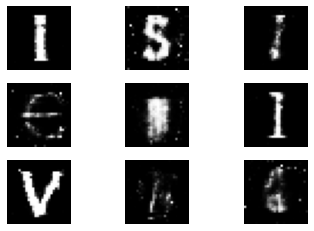

epoch:23, iter:0,  [D loss: 0.318890, acc.: 90.62%] [G loss: 1.576750]
epoch:23, iter:1,  [D loss: 0.449037, acc.: 75.00%] [G loss: 1.466185]
epoch:23, iter:2,  [D loss: 0.328402, acc.: 84.38%] [G loss: 1.913202]
epoch:23, iter:3,  [D loss: 0.404234, acc.: 78.12%] [G loss: 1.682748]
epoch:23, iter:4,  [D loss: 0.623726, acc.: 68.75%] [G loss: 1.438862]
epoch:23, iter:5,  [D loss: 0.434094, acc.: 78.12%] [G loss: 1.409504]
epoch:23, iter:6,  [D loss: 0.396412, acc.: 84.38%] [G loss: 1.424779]
epoch:23, iter:7,  [D loss: 0.456952, acc.: 75.00%] [G loss: 1.650919]
epoch:23, iter:8,  [D loss: 0.358506, acc.: 87.50%] [G loss: 1.832482]
epoch:23, iter:9,  [D loss: 0.461475, acc.: 75.00%] [G loss: 1.890554]
epoch:23, iter:10,  [D loss: 0.327084, acc.: 87.50%] [G loss: 1.589385]
epoch:23, iter:11,  [D loss: 0.395294, acc.: 81.25%] [G loss: 1.452634]
epoch:23, iter:12,  [D loss: 0.503733, acc.: 78.12%] [G loss: 1.710931]
epoch:23, iter:13,  [D loss: 0.693469, acc.: 71.88%] [G loss: 1.846561]
ep

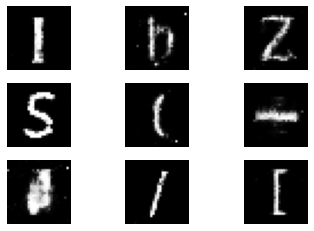

epoch:24, iter:0,  [D loss: 0.423953, acc.: 71.88%] [G loss: 1.367751]
epoch:24, iter:1,  [D loss: 0.548265, acc.: 68.75%] [G loss: 1.319366]
epoch:24, iter:2,  [D loss: 0.411839, acc.: 84.38%] [G loss: 1.491560]
epoch:24, iter:3,  [D loss: 0.512996, acc.: 71.88%] [G loss: 1.424989]
epoch:24, iter:4,  [D loss: 0.481157, acc.: 78.12%] [G loss: 1.584095]
epoch:24, iter:5,  [D loss: 0.369197, acc.: 81.25%] [G loss: 1.697743]
epoch:24, iter:6,  [D loss: 0.642377, acc.: 71.88%] [G loss: 1.482553]
epoch:24, iter:7,  [D loss: 0.480378, acc.: 75.00%] [G loss: 1.342902]
epoch:24, iter:8,  [D loss: 0.519352, acc.: 78.12%] [G loss: 1.549216]
epoch:24, iter:9,  [D loss: 0.715690, acc.: 65.62%] [G loss: 1.332745]
epoch:24, iter:10,  [D loss: 0.461811, acc.: 78.12%] [G loss: 1.526404]
epoch:24, iter:11,  [D loss: 0.557223, acc.: 81.25%] [G loss: 1.439635]
epoch:24, iter:12,  [D loss: 0.631381, acc.: 68.75%] [G loss: 1.313287]
epoch:24, iter:13,  [D loss: 0.376114, acc.: 90.62%] [G loss: 1.274539]
ep

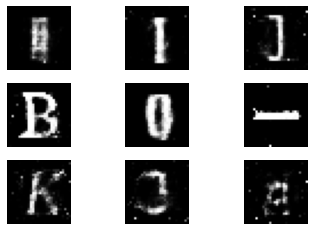

epoch:25, iter:0,  [D loss: 0.678299, acc.: 68.75%] [G loss: 1.576993]
epoch:25, iter:1,  [D loss: 0.344270, acc.: 81.25%] [G loss: 1.598676]
epoch:25, iter:2,  [D loss: 0.758942, acc.: 59.38%] [G loss: 1.542806]
epoch:25, iter:3,  [D loss: 0.368068, acc.: 84.38%] [G loss: 1.702188]
epoch:25, iter:4,  [D loss: 0.381019, acc.: 87.50%] [G loss: 1.660013]
epoch:25, iter:5,  [D loss: 0.394350, acc.: 84.38%] [G loss: 1.449758]
epoch:25, iter:6,  [D loss: 0.458025, acc.: 78.12%] [G loss: 1.220884]
epoch:25, iter:7,  [D loss: 0.293342, acc.: 93.75%] [G loss: 1.506835]
epoch:25, iter:8,  [D loss: 0.637527, acc.: 68.75%] [G loss: 1.345742]
epoch:25, iter:9,  [D loss: 0.431251, acc.: 78.12%] [G loss: 1.422773]
epoch:25, iter:10,  [D loss: 0.396391, acc.: 81.25%] [G loss: 1.409880]
epoch:25, iter:11,  [D loss: 0.800989, acc.: 68.75%] [G loss: 1.225421]
epoch:25, iter:12,  [D loss: 0.540952, acc.: 68.75%] [G loss: 1.377197]
epoch:25, iter:13,  [D loss: 0.422616, acc.: 81.25%] [G loss: 1.464156]
ep

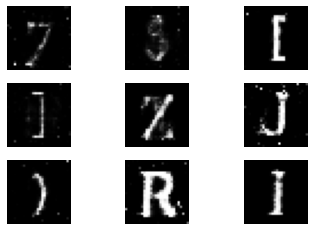

epoch:26, iter:0,  [D loss: 0.518160, acc.: 71.88%] [G loss: 1.608690]
epoch:26, iter:1,  [D loss: 0.470656, acc.: 71.88%] [G loss: 1.461278]
epoch:26, iter:2,  [D loss: 0.489472, acc.: 78.12%] [G loss: 1.424218]
epoch:26, iter:3,  [D loss: 0.438474, acc.: 78.12%] [G loss: 1.455733]
epoch:26, iter:4,  [D loss: 0.538931, acc.: 71.88%] [G loss: 1.779058]
epoch:26, iter:5,  [D loss: 0.362902, acc.: 93.75%] [G loss: 1.809045]
epoch:26, iter:6,  [D loss: 0.598908, acc.: 62.50%] [G loss: 1.644021]
epoch:26, iter:7,  [D loss: 0.300550, acc.: 90.62%] [G loss: 1.561008]
epoch:26, iter:8,  [D loss: 0.564455, acc.: 68.75%] [G loss: 1.353806]
epoch:26, iter:9,  [D loss: 0.639444, acc.: 62.50%] [G loss: 1.547174]
epoch:26, iter:10,  [D loss: 0.388430, acc.: 84.38%] [G loss: 1.490983]
epoch:26, iter:11,  [D loss: 0.407915, acc.: 81.25%] [G loss: 1.334281]
epoch:26, iter:12,  [D loss: 0.488857, acc.: 78.12%] [G loss: 1.362412]
epoch:26, iter:13,  [D loss: 0.343939, acc.: 81.25%] [G loss: 1.351005]
ep

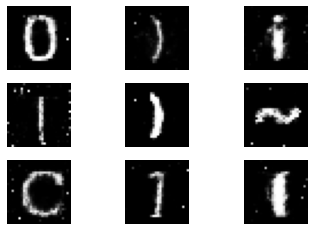

epoch:27, iter:0,  [D loss: 0.475190, acc.: 78.12%] [G loss: 1.807765]
epoch:27, iter:1,  [D loss: 0.408203, acc.: 81.25%] [G loss: 1.451169]
epoch:27, iter:2,  [D loss: 0.519272, acc.: 78.12%] [G loss: 1.568255]
epoch:27, iter:3,  [D loss: 0.391177, acc.: 81.25%] [G loss: 1.704044]
epoch:27, iter:4,  [D loss: 0.455531, acc.: 75.00%] [G loss: 1.645696]
epoch:27, iter:5,  [D loss: 0.450258, acc.: 78.12%] [G loss: 1.789912]
epoch:27, iter:6,  [D loss: 0.380250, acc.: 81.25%] [G loss: 1.622269]
epoch:27, iter:7,  [D loss: 0.426954, acc.: 87.50%] [G loss: 1.603151]
epoch:27, iter:8,  [D loss: 0.649882, acc.: 62.50%] [G loss: 1.508365]
epoch:27, iter:9,  [D loss: 0.580669, acc.: 71.88%] [G loss: 1.574760]
epoch:27, iter:10,  [D loss: 0.545115, acc.: 68.75%] [G loss: 1.364186]
epoch:27, iter:11,  [D loss: 0.349266, acc.: 81.25%] [G loss: 1.512824]
epoch:27, iter:12,  [D loss: 0.383572, acc.: 81.25%] [G loss: 1.650552]
epoch:27, iter:13,  [D loss: 0.345771, acc.: 84.38%] [G loss: 1.447161]
ep

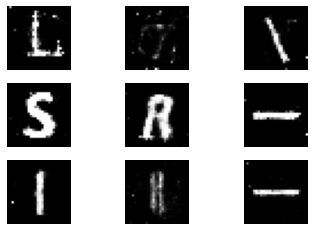

epoch:28, iter:0,  [D loss: 0.299433, acc.: 90.62%] [G loss: 1.658428]
epoch:28, iter:1,  [D loss: 0.573252, acc.: 75.00%] [G loss: 1.916276]
epoch:28, iter:2,  [D loss: 0.530347, acc.: 68.75%] [G loss: 1.867633]
epoch:28, iter:3,  [D loss: 0.493982, acc.: 78.12%] [G loss: 1.696170]
epoch:28, iter:4,  [D loss: 0.642984, acc.: 68.75%] [G loss: 1.651145]
epoch:28, iter:5,  [D loss: 0.418120, acc.: 75.00%] [G loss: 1.631686]
epoch:28, iter:6,  [D loss: 0.515635, acc.: 75.00%] [G loss: 1.851097]
epoch:28, iter:7,  [D loss: 0.516169, acc.: 81.25%] [G loss: 1.797979]
epoch:28, iter:8,  [D loss: 0.691784, acc.: 65.62%] [G loss: 1.734688]
epoch:28, iter:9,  [D loss: 0.407821, acc.: 78.12%] [G loss: 1.694004]
epoch:28, iter:10,  [D loss: 0.404693, acc.: 78.12%] [G loss: 1.455165]
epoch:28, iter:11,  [D loss: 0.430352, acc.: 84.38%] [G loss: 1.537339]
epoch:28, iter:12,  [D loss: 0.481475, acc.: 78.12%] [G loss: 1.283080]
epoch:28, iter:13,  [D loss: 0.358093, acc.: 81.25%] [G loss: 1.445843]
ep

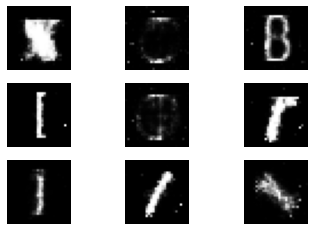

epoch:29, iter:0,  [D loss: 0.478549, acc.: 84.38%] [G loss: 1.736229]
epoch:29, iter:1,  [D loss: 0.524027, acc.: 78.12%] [G loss: 1.947565]
epoch:29, iter:2,  [D loss: 0.516283, acc.: 68.75%] [G loss: 1.842554]
epoch:29, iter:3,  [D loss: 0.689147, acc.: 62.50%] [G loss: 1.637069]
epoch:29, iter:4,  [D loss: 0.479819, acc.: 75.00%] [G loss: 1.541818]
epoch:29, iter:5,  [D loss: 0.472899, acc.: 78.12%] [G loss: 1.574921]
epoch:29, iter:6,  [D loss: 0.317289, acc.: 87.50%] [G loss: 1.724790]
epoch:29, iter:7,  [D loss: 0.546510, acc.: 78.12%] [G loss: 1.918083]
epoch:29, iter:8,  [D loss: 0.470363, acc.: 71.88%] [G loss: 1.792474]
epoch:29, iter:9,  [D loss: 0.385081, acc.: 87.50%] [G loss: 1.710828]
epoch:29, iter:10,  [D loss: 0.411734, acc.: 84.38%] [G loss: 1.634535]
epoch:29, iter:11,  [D loss: 0.411787, acc.: 78.12%] [G loss: 1.634220]
epoch:29, iter:12,  [D loss: 0.553489, acc.: 68.75%] [G loss: 1.495863]
epoch:29, iter:13,  [D loss: 0.354515, acc.: 87.50%] [G loss: 1.485506]
ep

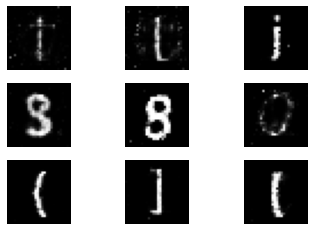

epoch:30, iter:0,  [D loss: 0.496402, acc.: 78.12%] [G loss: 1.912999]
epoch:30, iter:1,  [D loss: 0.406493, acc.: 87.50%] [G loss: 1.752727]
epoch:30, iter:2,  [D loss: 0.484358, acc.: 75.00%] [G loss: 1.877491]
epoch:30, iter:3,  [D loss: 0.332655, acc.: 84.38%] [G loss: 1.983119]
epoch:30, iter:4,  [D loss: 0.503356, acc.: 84.38%] [G loss: 1.678960]
epoch:30, iter:5,  [D loss: 0.583734, acc.: 65.62%] [G loss: 1.830084]
epoch:30, iter:6,  [D loss: 0.641938, acc.: 62.50%] [G loss: 1.297064]
epoch:30, iter:7,  [D loss: 0.518785, acc.: 81.25%] [G loss: 1.555920]
epoch:30, iter:8,  [D loss: 0.380348, acc.: 87.50%] [G loss: 1.464378]
epoch:30, iter:9,  [D loss: 0.627889, acc.: 68.75%] [G loss: 1.801275]
epoch:30, iter:10,  [D loss: 0.606082, acc.: 68.75%] [G loss: 1.730016]
epoch:30, iter:11,  [D loss: 0.376338, acc.: 84.38%] [G loss: 1.478231]
epoch:30, iter:12,  [D loss: 0.486155, acc.: 68.75%] [G loss: 1.670274]
epoch:30, iter:13,  [D loss: 0.512596, acc.: 75.00%] [G loss: 1.615053]
ep

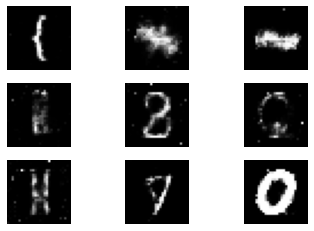

epoch:31, iter:0,  [D loss: 0.308795, acc.: 87.50%] [G loss: 1.801818]
epoch:31, iter:1,  [D loss: 0.360550, acc.: 84.38%] [G loss: 1.453085]
epoch:31, iter:2,  [D loss: 0.465947, acc.: 75.00%] [G loss: 1.808429]
epoch:31, iter:3,  [D loss: 0.404462, acc.: 84.38%] [G loss: 1.573659]
epoch:31, iter:4,  [D loss: 0.322084, acc.: 84.38%] [G loss: 1.678746]
epoch:31, iter:5,  [D loss: 0.431947, acc.: 81.25%] [G loss: 1.478734]
epoch:31, iter:6,  [D loss: 0.458591, acc.: 84.38%] [G loss: 1.421901]
epoch:31, iter:7,  [D loss: 0.546632, acc.: 71.88%] [G loss: 1.441872]
epoch:31, iter:8,  [D loss: 0.466109, acc.: 78.12%] [G loss: 1.529313]
epoch:31, iter:9,  [D loss: 0.827375, acc.: 50.00%] [G loss: 1.533470]
epoch:31, iter:10,  [D loss: 0.449559, acc.: 84.38%] [G loss: 1.575954]
epoch:31, iter:11,  [D loss: 0.569279, acc.: 75.00%] [G loss: 1.425087]
epoch:31, iter:12,  [D loss: 0.519862, acc.: 71.88%] [G loss: 1.355548]
epoch:31, iter:13,  [D loss: 0.415410, acc.: 84.38%] [G loss: 1.403589]
ep

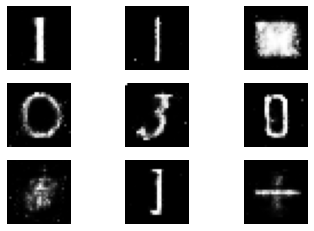

epoch:32, iter:0,  [D loss: 0.458079, acc.: 78.12%] [G loss: 1.566107]
epoch:32, iter:1,  [D loss: 0.495723, acc.: 75.00%] [G loss: 1.617618]
epoch:32, iter:2,  [D loss: 0.542403, acc.: 75.00%] [G loss: 1.589710]
epoch:32, iter:3,  [D loss: 0.459420, acc.: 87.50%] [G loss: 1.411958]
epoch:32, iter:4,  [D loss: 0.496582, acc.: 78.12%] [G loss: 1.751500]
epoch:32, iter:5,  [D loss: 0.600371, acc.: 65.62%] [G loss: 1.484404]
epoch:32, iter:6,  [D loss: 0.471964, acc.: 81.25%] [G loss: 1.420982]
epoch:32, iter:7,  [D loss: 0.469130, acc.: 78.12%] [G loss: 1.526053]
epoch:32, iter:8,  [D loss: 0.522002, acc.: 71.88%] [G loss: 1.800788]
epoch:32, iter:9,  [D loss: 0.430116, acc.: 75.00%] [G loss: 1.463107]
epoch:32, iter:10,  [D loss: 0.494263, acc.: 75.00%] [G loss: 1.654971]
epoch:32, iter:11,  [D loss: 0.501965, acc.: 81.25%] [G loss: 1.270675]
epoch:32, iter:12,  [D loss: 0.578073, acc.: 71.88%] [G loss: 1.390831]
epoch:32, iter:13,  [D loss: 0.370793, acc.: 84.38%] [G loss: 1.311537]
ep

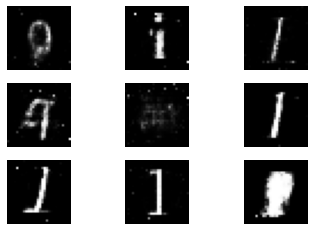

epoch:33, iter:0,  [D loss: 0.479383, acc.: 71.88%] [G loss: 1.411583]
epoch:33, iter:1,  [D loss: 0.476332, acc.: 81.25%] [G loss: 1.397194]
epoch:33, iter:2,  [D loss: 0.404617, acc.: 84.38%] [G loss: 1.576169]
epoch:33, iter:3,  [D loss: 0.620842, acc.: 78.12%] [G loss: 1.432326]
epoch:33, iter:4,  [D loss: 0.403381, acc.: 81.25%] [G loss: 1.453406]
epoch:33, iter:5,  [D loss: 0.458084, acc.: 75.00%] [G loss: 1.699900]
epoch:33, iter:6,  [D loss: 0.576458, acc.: 71.88%] [G loss: 1.356205]
epoch:33, iter:7,  [D loss: 0.392274, acc.: 81.25%] [G loss: 1.436242]
epoch:33, iter:8,  [D loss: 0.662794, acc.: 68.75%] [G loss: 1.342204]
epoch:33, iter:9,  [D loss: 0.403893, acc.: 78.12%] [G loss: 1.922386]
epoch:33, iter:10,  [D loss: 0.403189, acc.: 84.38%] [G loss: 1.923556]
epoch:33, iter:11,  [D loss: 0.423983, acc.: 81.25%] [G loss: 1.729146]
epoch:33, iter:12,  [D loss: 0.363708, acc.: 81.25%] [G loss: 1.774953]
epoch:33, iter:13,  [D loss: 0.347474, acc.: 84.38%] [G loss: 1.832167]
ep

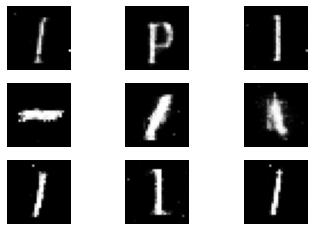

epoch:34, iter:0,  [D loss: 0.467849, acc.: 71.88%] [G loss: 1.496141]
epoch:34, iter:1,  [D loss: 0.356384, acc.: 87.50%] [G loss: 1.470124]
epoch:34, iter:2,  [D loss: 0.524277, acc.: 68.75%] [G loss: 1.586152]
epoch:34, iter:3,  [D loss: 0.423630, acc.: 75.00%] [G loss: 1.561348]
epoch:34, iter:4,  [D loss: 0.658237, acc.: 68.75%] [G loss: 1.254644]
epoch:34, iter:5,  [D loss: 0.451388, acc.: 81.25%] [G loss: 1.370234]
epoch:34, iter:6,  [D loss: 0.536933, acc.: 65.62%] [G loss: 1.651556]
epoch:34, iter:7,  [D loss: 0.748143, acc.: 62.50%] [G loss: 1.905064]
epoch:34, iter:8,  [D loss: 0.529848, acc.: 75.00%] [G loss: 1.775855]
epoch:34, iter:9,  [D loss: 0.508804, acc.: 75.00%] [G loss: 1.841078]
epoch:34, iter:10,  [D loss: 0.391852, acc.: 78.12%] [G loss: 1.864171]
epoch:34, iter:11,  [D loss: 0.311619, acc.: 84.38%] [G loss: 1.455403]
epoch:34, iter:12,  [D loss: 0.455129, acc.: 87.50%] [G loss: 1.825457]
epoch:34, iter:13,  [D loss: 0.524936, acc.: 68.75%] [G loss: 1.596336]
ep

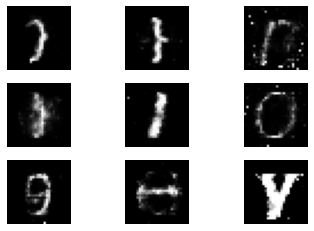

epoch:35, iter:0,  [D loss: 0.319259, acc.: 90.62%] [G loss: 1.642143]
epoch:35, iter:1,  [D loss: 0.404693, acc.: 78.12%] [G loss: 1.651709]
epoch:35, iter:2,  [D loss: 0.618842, acc.: 78.12%] [G loss: 1.731899]
epoch:35, iter:3,  [D loss: 0.413524, acc.: 78.12%] [G loss: 1.820987]
epoch:35, iter:4,  [D loss: 0.367237, acc.: 78.12%] [G loss: 1.800908]
epoch:35, iter:5,  [D loss: 0.611557, acc.: 62.50%] [G loss: 1.751154]
epoch:35, iter:6,  [D loss: 0.403766, acc.: 84.38%] [G loss: 1.718324]
epoch:35, iter:7,  [D loss: 0.314744, acc.: 87.50%] [G loss: 1.630655]
epoch:35, iter:8,  [D loss: 0.387370, acc.: 75.00%] [G loss: 1.644484]
epoch:35, iter:9,  [D loss: 0.408609, acc.: 81.25%] [G loss: 1.606278]
epoch:35, iter:10,  [D loss: 0.444043, acc.: 78.12%] [G loss: 1.510279]
epoch:35, iter:11,  [D loss: 0.556894, acc.: 71.88%] [G loss: 1.491300]
epoch:35, iter:12,  [D loss: 0.678510, acc.: 62.50%] [G loss: 1.361269]
epoch:35, iter:13,  [D loss: 0.450941, acc.: 81.25%] [G loss: 1.693719]
ep

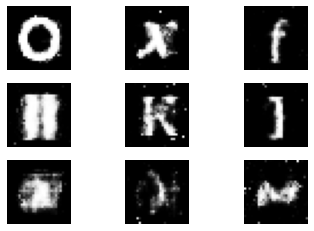

epoch:36, iter:0,  [D loss: 0.421997, acc.: 84.38%] [G loss: 1.982376]
epoch:36, iter:1,  [D loss: 0.617151, acc.: 65.62%] [G loss: 1.758015]
epoch:36, iter:2,  [D loss: 0.567828, acc.: 68.75%] [G loss: 1.462958]
epoch:36, iter:3,  [D loss: 0.401625, acc.: 90.62%] [G loss: 1.452878]
epoch:36, iter:4,  [D loss: 0.256611, acc.: 90.62%] [G loss: 1.678227]
epoch:36, iter:5,  [D loss: 0.397304, acc.: 87.50%] [G loss: 1.471540]
epoch:36, iter:6,  [D loss: 0.268341, acc.: 93.75%] [G loss: 1.435862]
epoch:36, iter:7,  [D loss: 0.489185, acc.: 78.12%] [G loss: 1.472242]
epoch:36, iter:8,  [D loss: 0.270409, acc.: 84.38%] [G loss: 1.618885]
epoch:36, iter:9,  [D loss: 0.480374, acc.: 75.00%] [G loss: 1.557255]
epoch:36, iter:10,  [D loss: 0.425730, acc.: 78.12%] [G loss: 1.617965]
epoch:36, iter:11,  [D loss: 0.495785, acc.: 75.00%] [G loss: 1.287239]
epoch:36, iter:12,  [D loss: 0.585804, acc.: 71.88%] [G loss: 1.522767]
epoch:36, iter:13,  [D loss: 0.531650, acc.: 68.75%] [G loss: 1.608467]
ep

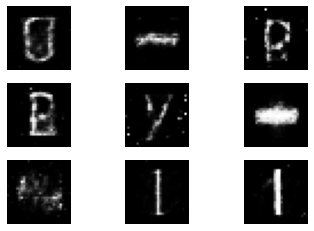

epoch:37, iter:0,  [D loss: 0.442067, acc.: 84.38%] [G loss: 1.607015]
epoch:37, iter:1,  [D loss: 0.687427, acc.: 68.75%] [G loss: 1.702445]
epoch:37, iter:2,  [D loss: 0.297190, acc.: 84.38%] [G loss: 1.511174]
epoch:37, iter:3,  [D loss: 0.433385, acc.: 75.00%] [G loss: 1.429214]
epoch:37, iter:4,  [D loss: 0.330262, acc.: 90.62%] [G loss: 1.581408]
epoch:37, iter:5,  [D loss: 0.234598, acc.: 90.62%] [G loss: 1.766113]
epoch:37, iter:6,  [D loss: 0.575657, acc.: 75.00%] [G loss: 1.798454]
epoch:37, iter:7,  [D loss: 0.684379, acc.: 65.62%] [G loss: 1.751334]
epoch:37, iter:8,  [D loss: 0.373248, acc.: 84.38%] [G loss: 1.688832]
epoch:37, iter:9,  [D loss: 0.452355, acc.: 78.12%] [G loss: 1.758538]
epoch:37, iter:10,  [D loss: 0.459856, acc.: 81.25%] [G loss: 1.681836]
epoch:37, iter:11,  [D loss: 0.590411, acc.: 75.00%] [G loss: 1.636286]
epoch:37, iter:12,  [D loss: 0.359553, acc.: 90.62%] [G loss: 1.676502]
epoch:37, iter:13,  [D loss: 0.438381, acc.: 75.00%] [G loss: 1.863153]
ep

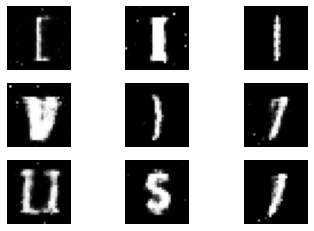

epoch:38, iter:0,  [D loss: 0.352754, acc.: 84.38%] [G loss: 1.420052]
epoch:38, iter:1,  [D loss: 0.466860, acc.: 78.12%] [G loss: 1.574974]
epoch:38, iter:2,  [D loss: 0.426044, acc.: 87.50%] [G loss: 1.688332]
epoch:38, iter:3,  [D loss: 0.566694, acc.: 65.62%] [G loss: 1.544723]
epoch:38, iter:4,  [D loss: 0.485111, acc.: 75.00%] [G loss: 1.882892]
epoch:38, iter:5,  [D loss: 0.450240, acc.: 84.38%] [G loss: 1.590600]
epoch:38, iter:6,  [D loss: 0.338558, acc.: 90.62%] [G loss: 1.928458]
epoch:38, iter:7,  [D loss: 0.415355, acc.: 81.25%] [G loss: 1.543105]
epoch:38, iter:8,  [D loss: 0.411631, acc.: 81.25%] [G loss: 1.588819]
epoch:38, iter:9,  [D loss: 0.355106, acc.: 81.25%] [G loss: 1.721277]
epoch:38, iter:10,  [D loss: 0.558143, acc.: 71.88%] [G loss: 1.691962]
epoch:38, iter:11,  [D loss: 0.453027, acc.: 75.00%] [G loss: 1.539218]
epoch:38, iter:12,  [D loss: 0.512474, acc.: 78.12%] [G loss: 1.354592]
epoch:38, iter:13,  [D loss: 0.366099, acc.: 84.38%] [G loss: 1.595062]
ep

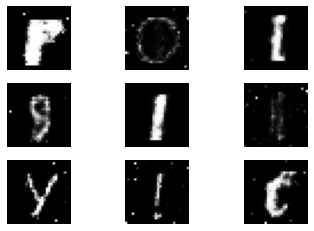

epoch:39, iter:0,  [D loss: 0.544793, acc.: 71.88%] [G loss: 1.235846]
epoch:39, iter:1,  [D loss: 0.422927, acc.: 75.00%] [G loss: 1.510336]
epoch:39, iter:2,  [D loss: 0.579976, acc.: 75.00%] [G loss: 1.481436]
epoch:39, iter:3,  [D loss: 0.383235, acc.: 81.25%] [G loss: 1.658335]
epoch:39, iter:4,  [D loss: 0.471638, acc.: 78.12%] [G loss: 1.591505]
epoch:39, iter:5,  [D loss: 0.429905, acc.: 84.38%] [G loss: 1.606000]
epoch:39, iter:6,  [D loss: 0.361881, acc.: 81.25%] [G loss: 1.633671]
epoch:39, iter:7,  [D loss: 0.472139, acc.: 78.12%] [G loss: 1.608507]
epoch:39, iter:8,  [D loss: 0.355572, acc.: 84.38%] [G loss: 1.518026]
epoch:39, iter:9,  [D loss: 0.414842, acc.: 84.38%] [G loss: 1.720016]
epoch:39, iter:10,  [D loss: 0.205323, acc.: 93.75%] [G loss: 1.912415]
epoch:39, iter:11,  [D loss: 0.597192, acc.: 71.88%] [G loss: 1.968994]
epoch:39, iter:12,  [D loss: 0.415192, acc.: 84.38%] [G loss: 1.653060]
epoch:39, iter:13,  [D loss: 0.579003, acc.: 68.75%] [G loss: 1.164662]
ep

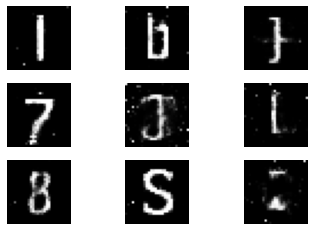

epoch:40, iter:0,  [D loss: 0.485086, acc.: 75.00%] [G loss: 1.562932]
epoch:40, iter:1,  [D loss: 0.876821, acc.: 62.50%] [G loss: 1.716610]
epoch:40, iter:2,  [D loss: 0.288846, acc.: 93.75%] [G loss: 1.814165]
epoch:40, iter:3,  [D loss: 0.616683, acc.: 78.12%] [G loss: 1.956288]
epoch:40, iter:4,  [D loss: 0.521724, acc.: 78.12%] [G loss: 1.664438]
epoch:40, iter:5,  [D loss: 0.423357, acc.: 87.50%] [G loss: 1.720783]
epoch:40, iter:6,  [D loss: 0.572962, acc.: 59.38%] [G loss: 1.440099]
epoch:40, iter:7,  [D loss: 0.254156, acc.: 93.75%] [G loss: 1.415926]
epoch:40, iter:8,  [D loss: 0.381744, acc.: 78.12%] [G loss: 1.663122]
epoch:40, iter:9,  [D loss: 0.440262, acc.: 78.12%] [G loss: 1.558916]
epoch:40, iter:10,  [D loss: 0.547188, acc.: 71.88%] [G loss: 1.466666]
epoch:40, iter:11,  [D loss: 0.481550, acc.: 71.88%] [G loss: 1.385034]
epoch:40, iter:12,  [D loss: 0.388229, acc.: 84.38%] [G loss: 1.509851]
epoch:40, iter:13,  [D loss: 0.455207, acc.: 81.25%] [G loss: 1.628158]
ep

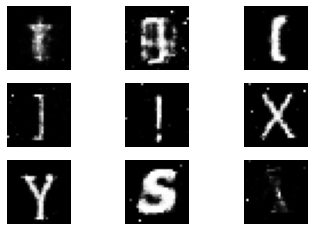

epoch:41, iter:0,  [D loss: 0.680786, acc.: 65.62%] [G loss: 1.908932]
epoch:41, iter:1,  [D loss: 0.462033, acc.: 71.88%] [G loss: 1.800525]
epoch:41, iter:2,  [D loss: 0.616958, acc.: 68.75%] [G loss: 1.917191]
epoch:41, iter:3,  [D loss: 0.462040, acc.: 75.00%] [G loss: 1.664560]
epoch:41, iter:4,  [D loss: 0.419683, acc.: 81.25%] [G loss: 1.683225]
epoch:41, iter:5,  [D loss: 0.468021, acc.: 78.12%] [G loss: 1.567699]
epoch:41, iter:6,  [D loss: 0.492791, acc.: 78.12%] [G loss: 1.665703]
epoch:41, iter:7,  [D loss: 0.320887, acc.: 87.50%] [G loss: 1.734102]
epoch:41, iter:8,  [D loss: 0.451809, acc.: 81.25%] [G loss: 1.774186]
epoch:41, iter:9,  [D loss: 0.370218, acc.: 81.25%] [G loss: 2.062687]
epoch:41, iter:10,  [D loss: 0.590542, acc.: 71.88%] [G loss: 1.931190]
epoch:41, iter:11,  [D loss: 0.503085, acc.: 75.00%] [G loss: 1.952403]
epoch:41, iter:12,  [D loss: 0.549383, acc.: 78.12%] [G loss: 1.749141]
epoch:41, iter:13,  [D loss: 0.384477, acc.: 84.38%] [G loss: 1.658418]
ep

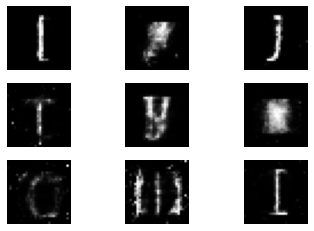

epoch:42, iter:0,  [D loss: 0.583740, acc.: 65.62%] [G loss: 1.420005]
epoch:42, iter:1,  [D loss: 0.408132, acc.: 78.12%] [G loss: 1.695670]
epoch:42, iter:2,  [D loss: 0.682620, acc.: 68.75%] [G loss: 1.722486]
epoch:42, iter:3,  [D loss: 0.383850, acc.: 87.50%] [G loss: 1.886285]
epoch:42, iter:4,  [D loss: 0.408386, acc.: 84.38%] [G loss: 1.808035]
epoch:42, iter:5,  [D loss: 0.329228, acc.: 84.38%] [G loss: 1.855439]
epoch:42, iter:6,  [D loss: 0.604606, acc.: 62.50%] [G loss: 1.855870]
epoch:42, iter:7,  [D loss: 0.680661, acc.: 65.62%] [G loss: 1.674548]
epoch:42, iter:8,  [D loss: 0.283361, acc.: 87.50%] [G loss: 1.574777]
epoch:42, iter:9,  [D loss: 0.518183, acc.: 78.12%] [G loss: 1.578836]
epoch:42, iter:10,  [D loss: 0.837390, acc.: 71.88%] [G loss: 1.749471]
epoch:42, iter:11,  [D loss: 0.389625, acc.: 84.38%] [G loss: 1.692836]
epoch:42, iter:12,  [D loss: 0.403597, acc.: 81.25%] [G loss: 1.479694]
epoch:42, iter:13,  [D loss: 0.389463, acc.: 78.12%] [G loss: 1.480328]
ep

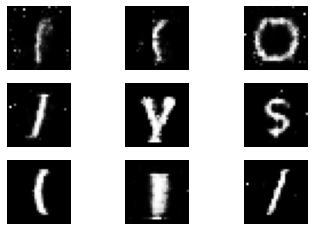

epoch:43, iter:0,  [D loss: 0.311169, acc.: 87.50%] [G loss: 1.428720]
epoch:43, iter:1,  [D loss: 0.553269, acc.: 62.50%] [G loss: 1.611397]
epoch:43, iter:2,  [D loss: 0.363341, acc.: 90.62%] [G loss: 1.675963]
epoch:43, iter:3,  [D loss: 0.351505, acc.: 93.75%] [G loss: 1.802777]
epoch:43, iter:4,  [D loss: 0.469741, acc.: 81.25%] [G loss: 1.960392]
epoch:43, iter:5,  [D loss: 0.398809, acc.: 84.38%] [G loss: 1.530754]
epoch:43, iter:6,  [D loss: 0.428196, acc.: 78.12%] [G loss: 1.581645]
epoch:43, iter:7,  [D loss: 0.448769, acc.: 75.00%] [G loss: 1.500755]
epoch:43, iter:8,  [D loss: 0.357641, acc.: 87.50%] [G loss: 1.323331]
epoch:43, iter:9,  [D loss: 0.485860, acc.: 81.25%] [G loss: 1.502383]
epoch:43, iter:10,  [D loss: 0.384259, acc.: 75.00%] [G loss: 1.462422]
epoch:43, iter:11,  [D loss: 0.527323, acc.: 84.38%] [G loss: 1.545949]
epoch:43, iter:12,  [D loss: 0.408474, acc.: 81.25%] [G loss: 1.621659]
epoch:43, iter:13,  [D loss: 0.392483, acc.: 87.50%] [G loss: 1.784574]
ep

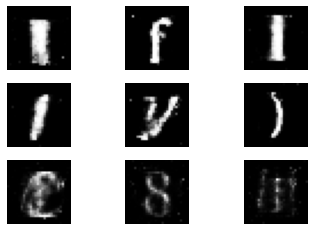

epoch:44, iter:0,  [D loss: 0.367476, acc.: 84.38%] [G loss: 1.441102]
epoch:44, iter:1,  [D loss: 0.478228, acc.: 75.00%] [G loss: 1.696793]
epoch:44, iter:2,  [D loss: 0.370187, acc.: 81.25%] [G loss: 1.470048]
epoch:44, iter:3,  [D loss: 0.412119, acc.: 78.12%] [G loss: 1.463562]
epoch:44, iter:4,  [D loss: 0.560185, acc.: 75.00%] [G loss: 1.540965]
epoch:44, iter:5,  [D loss: 0.390957, acc.: 87.50%] [G loss: 1.646453]
epoch:44, iter:6,  [D loss: 0.345190, acc.: 81.25%] [G loss: 1.770546]
epoch:44, iter:7,  [D loss: 0.856040, acc.: 56.25%] [G loss: 1.418310]
epoch:44, iter:8,  [D loss: 0.509173, acc.: 75.00%] [G loss: 1.644028]
epoch:44, iter:9,  [D loss: 0.706125, acc.: 68.75%] [G loss: 1.361717]
epoch:44, iter:10,  [D loss: 0.493413, acc.: 81.25%] [G loss: 1.306858]
epoch:44, iter:11,  [D loss: 0.364815, acc.: 78.12%] [G loss: 1.463560]
epoch:44, iter:12,  [D loss: 0.480208, acc.: 71.88%] [G loss: 1.471279]
epoch:44, iter:13,  [D loss: 0.478364, acc.: 84.38%] [G loss: 1.465171]
ep

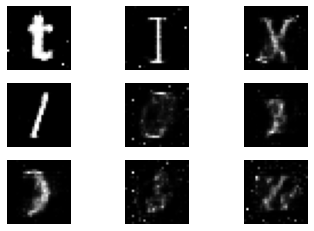

epoch:45, iter:0,  [D loss: 0.491620, acc.: 78.12%] [G loss: 1.639315]
epoch:45, iter:1,  [D loss: 0.369556, acc.: 81.25%] [G loss: 1.702312]
epoch:45, iter:2,  [D loss: 0.538620, acc.: 68.75%] [G loss: 1.440395]
epoch:45, iter:3,  [D loss: 0.403048, acc.: 75.00%] [G loss: 1.704410]
epoch:45, iter:4,  [D loss: 0.394388, acc.: 87.50%] [G loss: 1.612731]
epoch:45, iter:5,  [D loss: 0.413729, acc.: 68.75%] [G loss: 1.613666]
epoch:45, iter:6,  [D loss: 0.268550, acc.: 93.75%] [G loss: 1.854530]
epoch:45, iter:7,  [D loss: 0.550913, acc.: 71.88%] [G loss: 1.616660]
epoch:45, iter:8,  [D loss: 0.338159, acc.: 87.50%] [G loss: 1.908509]
epoch:45, iter:9,  [D loss: 0.362807, acc.: 78.12%] [G loss: 2.093939]
epoch:45, iter:10,  [D loss: 0.449281, acc.: 71.88%] [G loss: 1.792907]
epoch:45, iter:11,  [D loss: 0.602423, acc.: 68.75%] [G loss: 1.729038]
epoch:45, iter:12,  [D loss: 0.552271, acc.: 71.88%] [G loss: 1.718503]
epoch:45, iter:13,  [D loss: 0.225651, acc.: 84.38%] [G loss: 1.766272]
ep

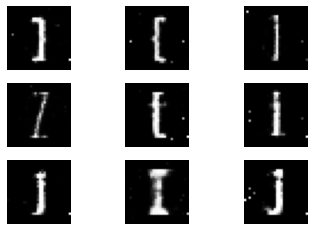

epoch:46, iter:0,  [D loss: 0.462638, acc.: 78.12%] [G loss: 1.566346]
epoch:46, iter:1,  [D loss: 0.263586, acc.: 90.62%] [G loss: 1.521588]
epoch:46, iter:2,  [D loss: 0.848004, acc.: 62.50%] [G loss: 1.585111]
epoch:46, iter:3,  [D loss: 0.404732, acc.: 75.00%] [G loss: 1.745125]
epoch:46, iter:4,  [D loss: 0.417351, acc.: 78.12%] [G loss: 1.598237]
epoch:46, iter:5,  [D loss: 0.361030, acc.: 81.25%] [G loss: 1.476614]
epoch:46, iter:6,  [D loss: 0.420855, acc.: 84.38%] [G loss: 1.434073]
epoch:46, iter:7,  [D loss: 0.255022, acc.: 87.50%] [G loss: 1.619908]
epoch:46, iter:8,  [D loss: 0.491648, acc.: 81.25%] [G loss: 1.597230]
epoch:46, iter:9,  [D loss: 0.407348, acc.: 75.00%] [G loss: 1.683949]
epoch:46, iter:10,  [D loss: 0.553901, acc.: 68.75%] [G loss: 1.338655]
epoch:46, iter:11,  [D loss: 0.457417, acc.: 78.12%] [G loss: 1.423524]
epoch:46, iter:12,  [D loss: 0.535321, acc.: 68.75%] [G loss: 1.534889]
epoch:46, iter:13,  [D loss: 0.496162, acc.: 68.75%] [G loss: 1.467157]
ep

In [ ]:
from keras import callbacks
#実行用
if __name__ == '__main__':
    gan = GAN()
    gan.train(epochs=300, batch_size=32, save_interval=1)